In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import spatialdata_io
import spatialdata as sd
import scanpy as sc

# while not pip installable, add path to file 
import sys 
sys.path.append("../../exrna")
from formatting import *
from quantify_overexpression import *
from spatial_variability import *
from compute_target import *
from plotting import *
from compute_source_cell import *
from compute_target import *
from estimate_density import *
from NMF import *

In [2]:
xenium_path_cropped='/media/sergio/Discovair_final/mousebrain_prime_crop_points2regions_annotated.zarr'
output_path='/media/sergio/Discovair_final/analysis_crop'
sdata=sd.read_zarr(xenium_path_cropped)

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argum

### Compute NMF in extracellular space

In [ ]:
key='cell type'
sdata['table'].X=sdata['table'].X.todense()

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/anndata/_core/storage.py:85: ImplicitModificationWarning: X should not be a np.matrix, use np.ndarray instead.
  warnings.warn(msg, ImplicitModificationWarning)


In [4]:
exp=sdata['table'].to_df()
exp[key]=sdata['table'].obs[key]
meansignature=exp.groupby(key).mean()


/tmp/ipykernel_414855/2620488850.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  meansignature=exp.groupby(key).mean()


In [ ]:
layer='segmentation_free_table'
adata_extracellular=sdata[layer]

In [37]:
genes_cells = meansignature.columns
genes_extracellular = adata_extracellular.var_names

# Get intersection of genes between the two datasets
common_genes = genes_cells.intersection(genes_extracellular)


In [38]:
common_genes

Index(['A2m', 'Aatf', 'Abca1', 'Abca3', 'Abca4', 'Abca7', 'Abca8a', 'Abca8b',
       'Abcb1a', 'Abcb1b',
       ...
       'Zmpste24', 'Zmynd10', 'Zmynd19', 'Zscan2', 'Zscan21', 'Zswim5',
       'Zswim9', 'Zup1', 'Zyx', 'Zzef1'],
      dtype='object', length=4226)

,A2m,Aatf,Abca1,Abca3,Abca4,Abca7,Abca8a,Abca8b,Abcb1a,Abcb1b,...,Zmpste24,Zmynd10,Zmynd19,Zscan2,Zscan21,Zswim5,Zswim9,Zup1,Zyx,Zzef1
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1698,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1699,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1700,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1701,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
exp=pd.DataFrame(sdata['table'].layers['raw'].todense(),columns=sdata['table'].var.index)
exp[key]=list(sdata['table'].obs[key])
meansignature=exp.groupby(key).mean()
meansignature=meansignature.div(meansignature.sum(axis=0),axis=1)

In [ ]:
def apply_exrnaH_to_cellular_to_create_cellularW(sdata,key='cell type',layer='segmentation_free_table'):
    adata_extracellular=sdata[layer]
    exp=pd.DataFrame(sdata['table'].layers['raw'].todense(),columns=sdata['table'].var.index)
    exp[key]=list(sdata['table'].obs[key])
    meansignature=exp.groupby(key).mean()
    meansignature=meansignature.div(meansignature.sum(axis=0),axis=1)

    # Check the number of genes in adata_annotated and spots2region_output to match gene loadings (H)
    genes_cells = meansignature.columns
    genes_extracellular = adata_extracellular.var_names

    # Get intersection of genes between the two datasets
    common_genes = genes_cells.intersection(genes_extracellular)

    # Filter both datasets to keep only common genes
    adata_extracellular = adata_extracellular[:, common_genes]
    H_filtered = meansignature.loc[:, common_genes]  # Filtered NMF gene loadings for common genes
    #H_filtered=H_filtered.loc[:,common_genes]
    # Apply the NMF factors to the annotated dataset
    # Calculate the new W matrix by multiplying the annotated data with the filtered H
    W_annotated = adata_extracellular.X @ H_filtered.T
    adata_extracellular.obsm['factors']=pd.DataFrame(W_annotated,columns=meansignature.index,index=adata_extracellular.obs.index)
    #print(W_annotated[:, 0].shape)
    # Add the factors as new columns in adata_annotated.obs
    #for factor in range(W_annotated.shape[1]):
    #    adata_annotated_cellular.obs[f'NMF_factor_{factor + 1}'] = W_annotated[:, factor]
    #sdata['table']=adata_annotated_cellular
    return adata_extracellular


In [95]:
def apply_exrnaH_to_cellular_to_create_cellularW(sdata, key='cell type', layer='segmentation_free_table'):
    # Extracting extracellular and expression data
    adata_extracellular = sdata[layer]
    exp=pd.DataFrame(sdata['table'].layers['raw'].todense(),columns=sdata['table'].var.index)
    exp[key]=list(sdata['table'].obs[key])
    meansignature=exp.groupby(key).mean()
    meansignature=meansignature.div(meansignature.sum(axis=0),axis=1)


    # Checking for matching genes
    genes_cells = meansignature.columns
    genes_extracellular = adata_extracellular.var_names
    common_genes = genes_cells.intersection(genes_extracellular)

    if len(common_genes) == 0:
        raise ValueError("No common genes found between cellular and extracellular datasets.")
    
    # Filter datasets to keep only common genes
    adata_extracellular = adata_extracellular[:, common_genes]
    H_filtered = meansignature.loc[:, common_genes]

    # Calculate the new W matrix
    W_annotated = adata_extracellular.X @ H_filtered.T
    adata_extracellular.obsm['factors'] = pd.DataFrame(W_annotated, columns=meansignature.index, index=adata_extracellular.obs.index)
    
    return adata_extracellular


In [96]:
adata_extracellular=apply_exrnaH_to_cellular_to_create_cellularW(sdata,key='cell type',layer='segmentation_free_table')

/tmp/ipykernel_414855/1445101888.py:24: ImplicitModificationWarning: Setting element `.obsm['factors']` of view, initializing view as actual.
  adata_extracellular.obsm['factors'] = pd.DataFrame(W_annotated, columns=meansignature.index, index=adata_extracellular.obs.index)


In [97]:
layer='extracellular_transcripts'
feature_key='feature_name'
bin_key='bin_id'

In [98]:
adata_scores=sc.AnnData(adata_extracellular.obsm['factors'],obs=adata_extracellular.obs)
adata_scores.obsm['spatial']=adata_extracellular.obsm['spatial']

In [99]:
sc.pp.subsample(adata_scores,0.1)

In [ ]:
adata_scores.X=adata_scores.X.astype(float)
adata_scores.obs.index=adata_scores.obs.index.astype(int)

In [101]:
adata_scores.obs['x']=[i[0] for i in adata_scores.obsm['spatial']]
adata_scores.obs['y']=[i[1] for i in adata_scores.obsm['spatial']]

In [104]:
adata_scores.to_df()[c]

1497550    1.182544
952231     5.032925
585274     0.822874
561895     0.141971
1289446    3.286127
             ...   
1255637    8.023808
1899039    3.212542
923279     3.706591
1699940    1.813796
993190     4.054479
Name: Oligo, Length: 211481, dtype: float64

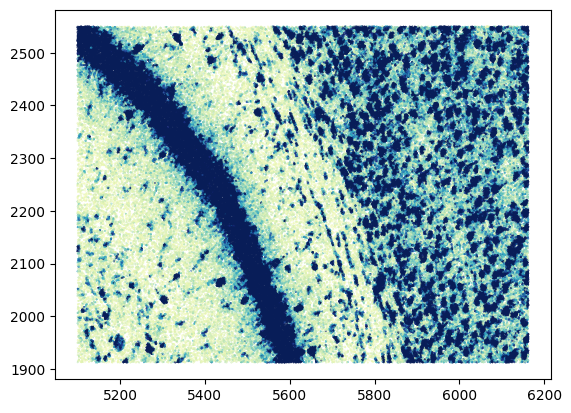

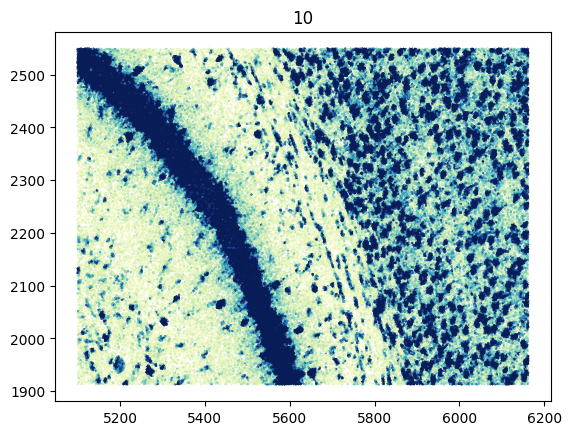

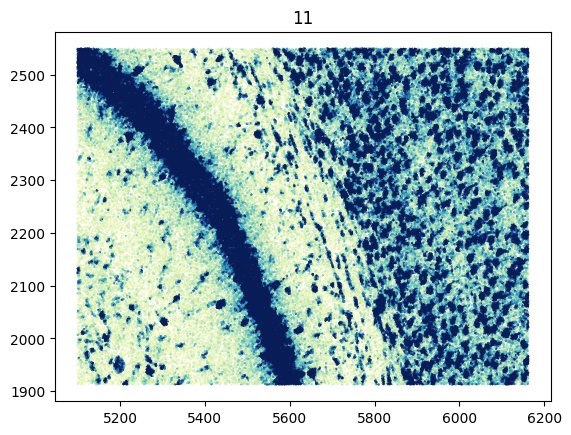

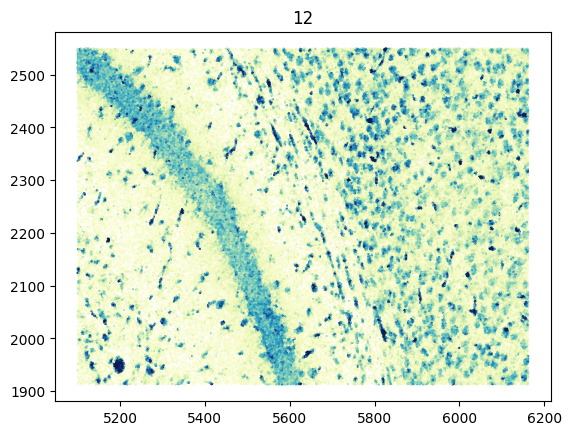

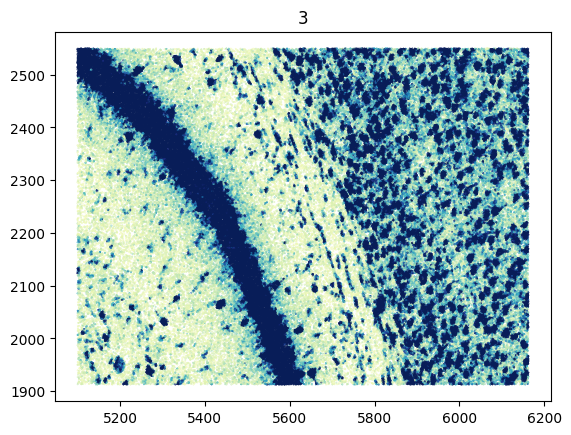

...

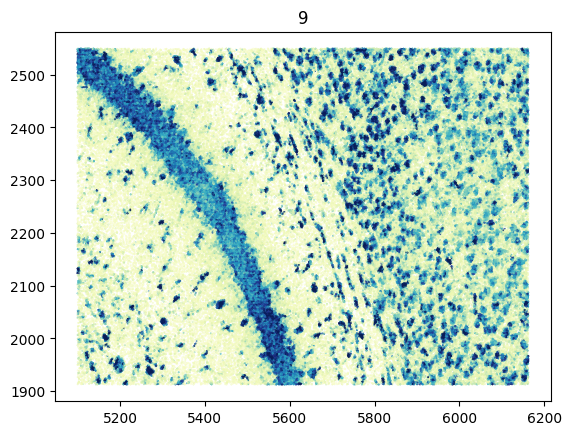

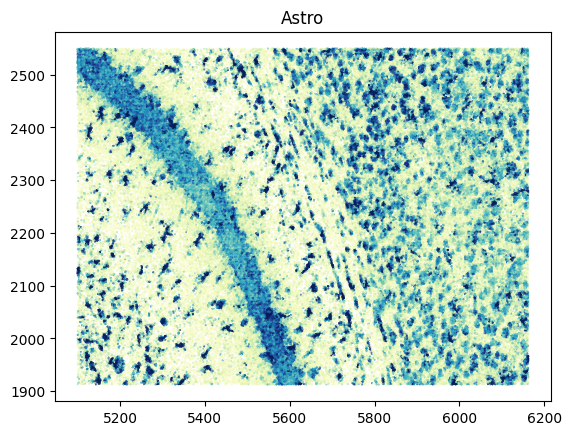

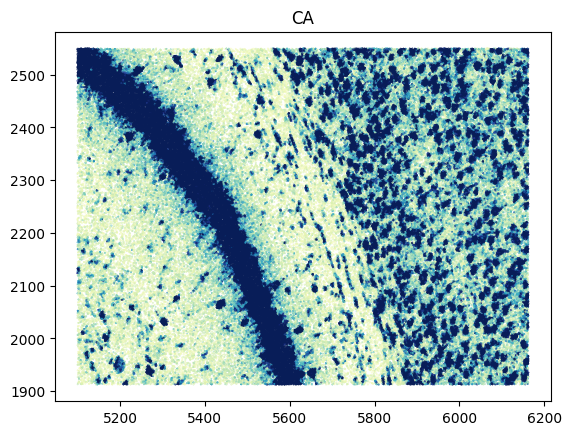

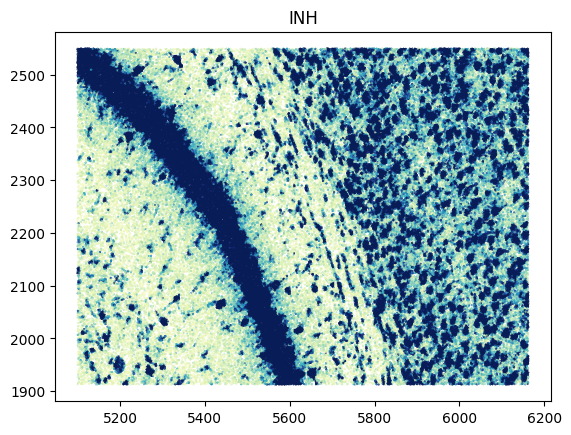

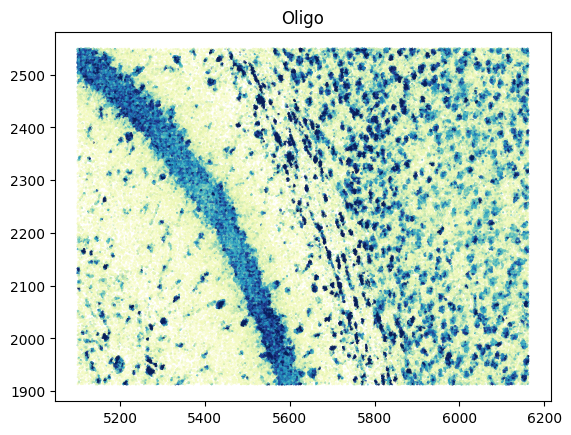

In [106]:
for c in adata_scores.var.index:
     plt.scatter(adata_scores.obs['x'],adata_scores.obs['y'],c=adata_scores.to_df()[c],s=0.1,cmap='YlGnBu',vmax=5)
     plt.title(c)
     plt.show()


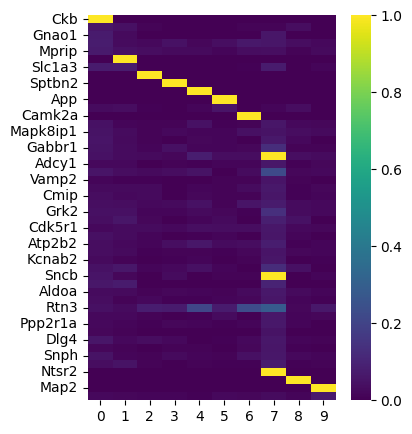

In [5]:
plot_nmf_factors_exrna_genes_H(sdata['nmf_data'], vmin=0.0, vmax=0.02,saving_path=output_path,save=False,figsize=(4,5))

# Apply nmf to cells

In [7]:
sdata = apply_exrnaH_to_cellular_to_create_cellularW(sdata,layer_factors='nmf_data')

/home/sergio/Jnotebooks/exRNA/spatial_exotranscriptomics/notebooks/spatial_data_tutorials/../../exrna/NMF.py:145: ImplicitModificationWarning: Setting element `.obsm['factors']` of view, initializing view as actual.
  adata_annotated_cellular.obsm['factors']=pd.DataFrame(W_annotated,index=adata_annotated_cellular.obs.index)


In [ ]:
sdata['nmf_data']

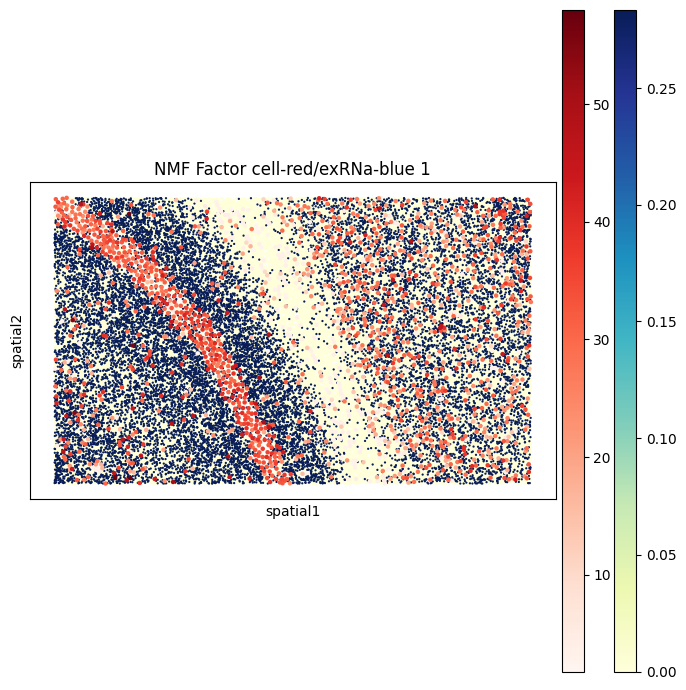

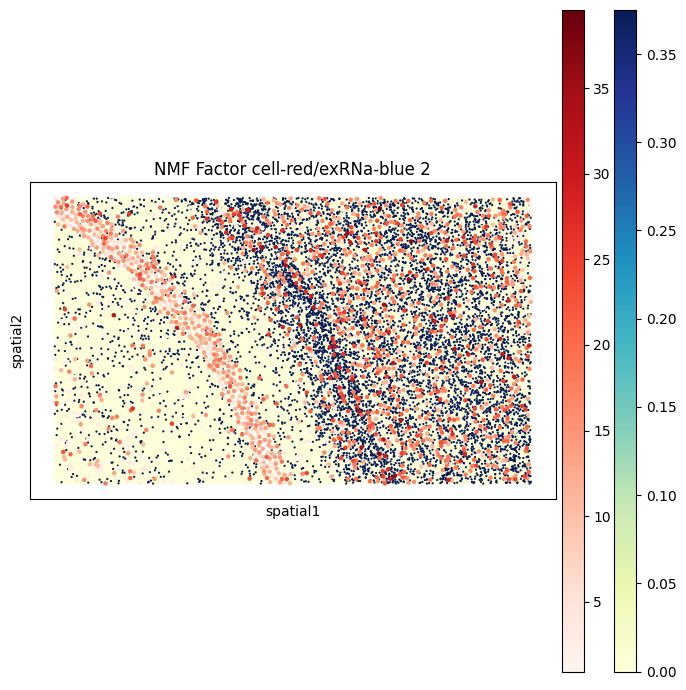

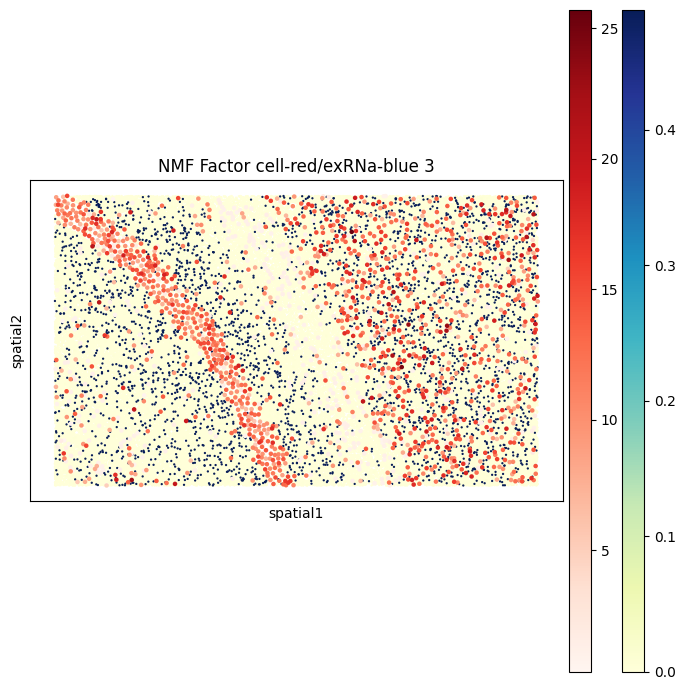

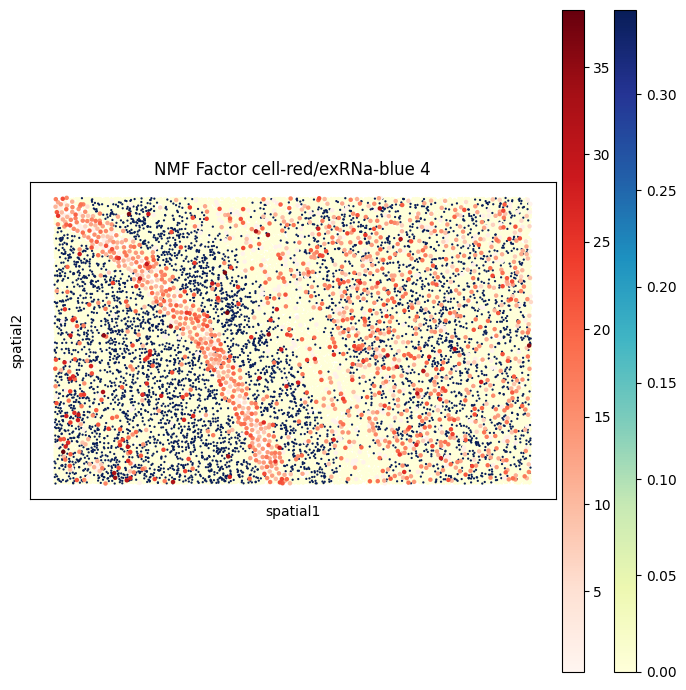

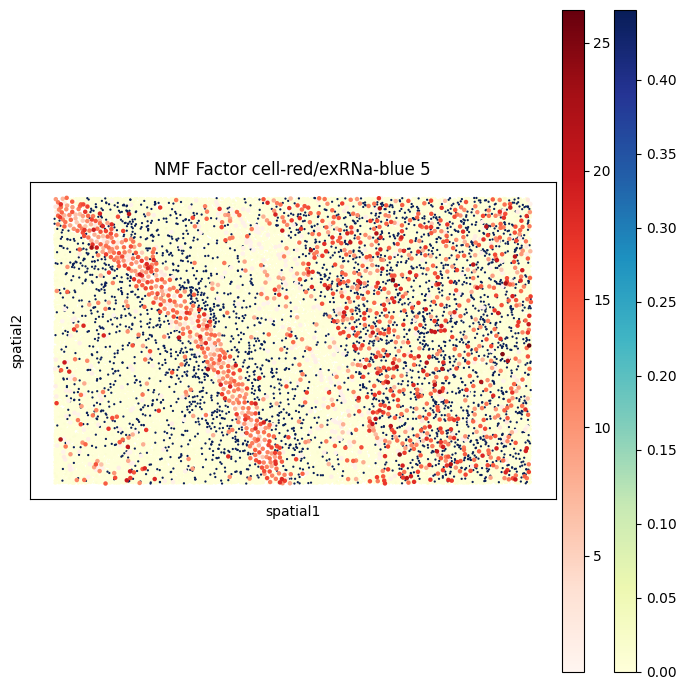

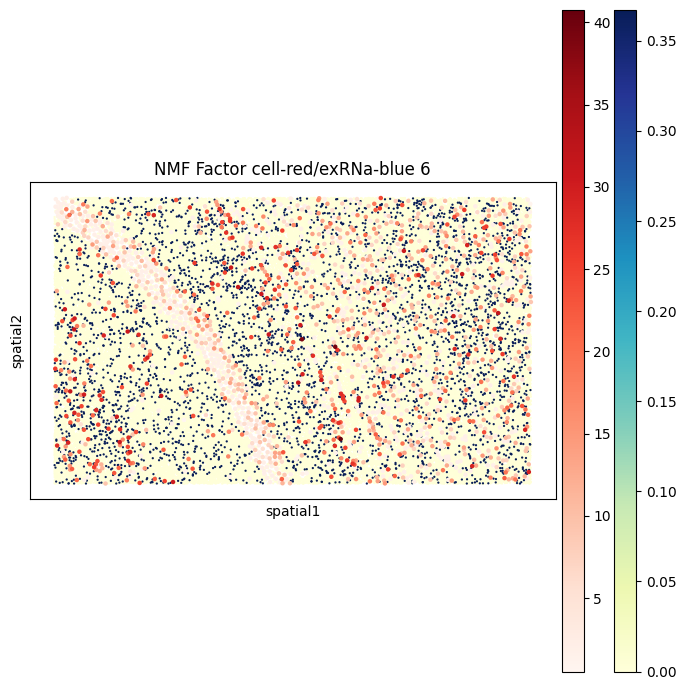

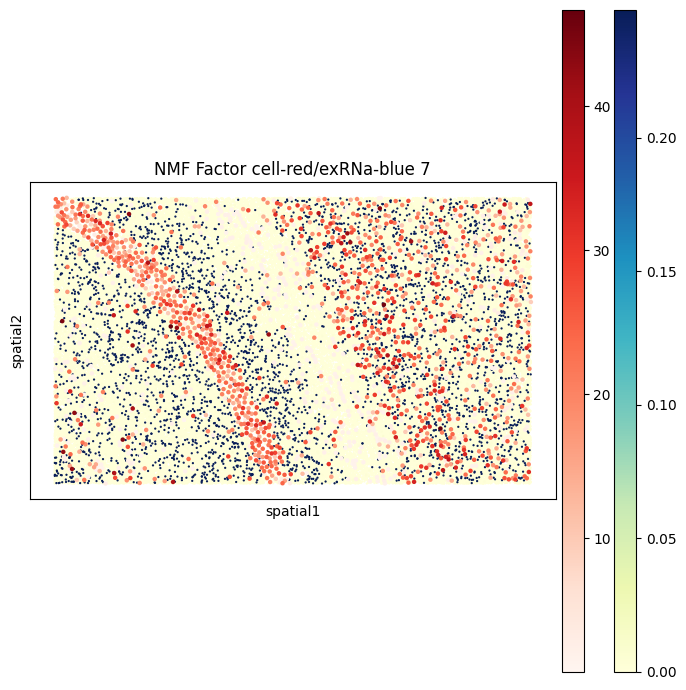

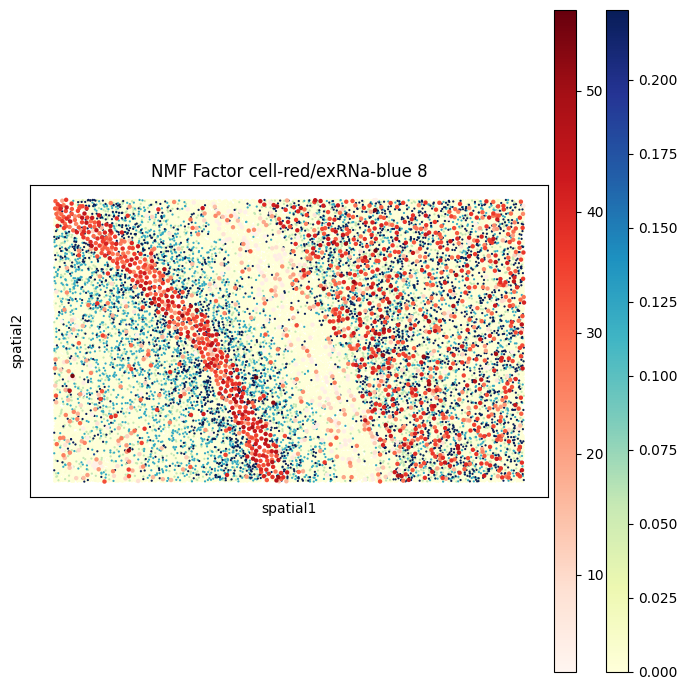

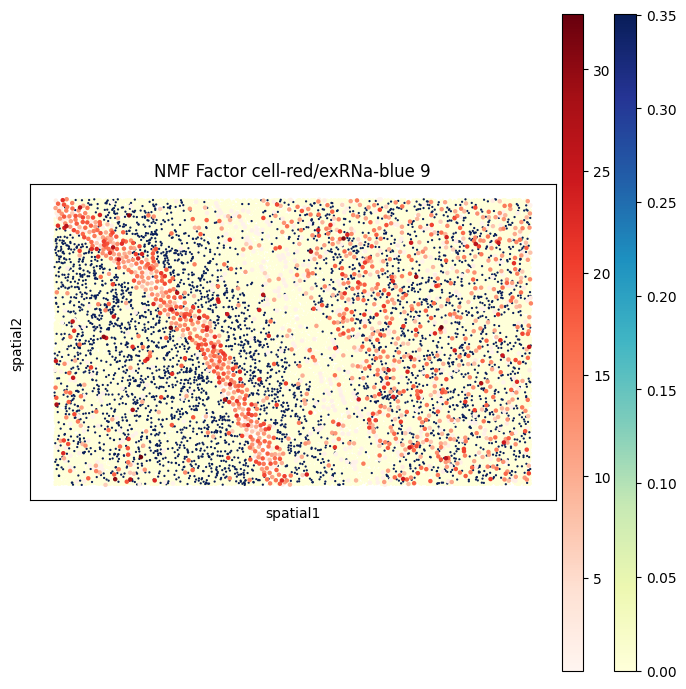

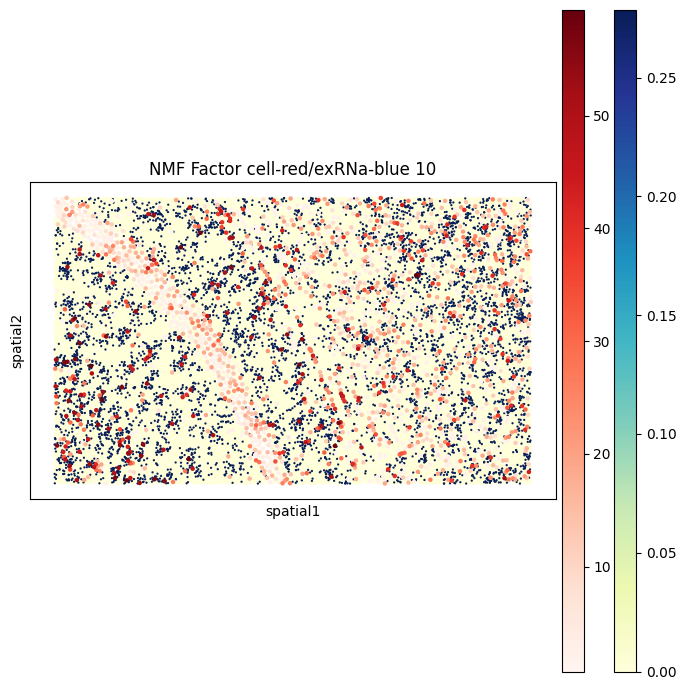

In [8]:
plot_nmf_factors(sdata,figsize=(7,7),n_factors=10)